# LexMax AI: Interactive Chatbot for Legal Latin Maxims and Equity Rules

## Author

Joel Ruetas

## Abstract

LexMax AI is an innovative chatbot designed to provide interactive assistance in understanding and applying Latin maxims and equity rules in law. This project leverages the integration of Langchain, ChatGPT, Pinecone, and Streamlit to create a user-friendly platform for law students, legal professionals, and anyone interested in legal maxims. The bot aims to demystify the complexities of legal language, offering explanations, examples, and applications of Latin maxims and equity principles.

## Background

This project transforms the traditional approach to studying legal maxims and equity rules by using cutting-edge AI and ML technologies. Langchain enhances the chatbot's ability to interpret and explain complex legal concepts, while ChatGPT provides a conversational interface. Pinecone's vector database is utilized for efficient data management and retrieval, and Streamlit offers an interactive web front-end for seamless user engagement.

## Objective

The main objectives of LexMax AI are:

1. Interpretation and Explanation: To provide clear, accurate interpretations and applications of Latin maxims and equity rules.
2. Personalized Learning Experience: To offer a tailored educational experience based on the user's knowledge level and interests.
3. Accessible Legal Education: To make legal principles more accessible to a broader audience.
4. Interactive User Interface: To create an engaging and user-friendly platform using Streamlit.

## Data
* The Project Gutenberg eBook [A collection of Latin maxims & rules in law and equity](https://www.gutenberg.org/ebooks/72240).
* User interaction data for improving response personalization and accuracy.

## pip install dependencies

In [ ]:
!pip install -q llmx langChain OpenAI pinecone-client tiktoken pypdf pypdf2 streamlit unstructured==0.7.12

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 22.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.9/220.9 kB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.4/179.4 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 70.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.6/277.6 kB 21.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 18.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 41.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 51.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 44.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.8/101.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.6/239.6 kB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━

## Set keys

In [ ]:
# KEYS and MODELS Related Settings
OPENAI_API_KEY = "<Add Key>"

# Pinecone
PINECONE_API_KEY = "<Add Key>"
PINECONE_ENV = "gcp-starter"
PINECONE_INDEX_NAME = "capstone"

In [ ]:
## Constants
PDF = '/content/gdrive/MyDrive/Chatbot/A collection of Latin maxims and rules, in law and equity.pdf'

## Import required modules

In [ ]:
import matplotlib.pyplot as plt
import openai, langchain, pinecone, os
import pandas as pd

from google.colab import drive
from langchain.agents import initialize_agent
from langchain.agents import Tool
from langchain.chat_models import ChatOpenAI
from langchain.chains import RetrievalQA
from langchain.chains.conversation.memory import ConversationBufferWindowMemory
from langchain.document_loaders import PyPDFLoader
from langchain.text_splitter import CharacterTextSplitter
from langchain.embeddings.openai import OpenAIEmbeddings
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain.vectorstores import Pinecone
from langchain.llms import OpenAI
from PyPDF2 import PdfReader
from sklearn.manifold import TSNE

/usr/local/lib/python3.10/dist-packages/pinecone/index.py:4: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [ ]:
# Mounting Google Drive to the Colab environment
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
os.environ['OPENAI_API_KEY'] = OPENAI_API_KEY
os.environ['PINECONE_API_KEY'] = PINECONE_API_KEY
os.environ['PINECONE_ENV'] = PINECONE_ENV
os.environ['PINECONE_INDEX_NAME'] = PINECONE_INDEX_NAME

## Initialize our text-embedding-ada-002 embedding model

In [ ]:
# OpenAI Embeddings setup
# MAX INPUT TOKENS: 8191
# OUTPUT DIMENSIONS: 1536
model_name = 'text-embedding-ada-002'

embeddings = OpenAIEmbeddings(
    model = model_name,
    openai_api_key = OPENAI_API_KEY
)

## Initialize the Pinecone vector database

In [ ]:
# Verify Pinecone API key works
pinecone.init(
    api_key = PINECONE_API_KEY,
    environment = PINECONE_ENV
)
# If you don't see an error message, then your API key is valid

# Check if index exists otherwise create it
if PINECONE_INDEX_NAME not in pinecone.list_indexes():
    # we create a new index
    pinecone.create_index(
        name = PINECONE_INDEX_NAME,
        metric = 'cosine',
        dimension = len(1536)  # 1536 dim of text-embedding-ada-002
    )

## Get statistics about your index

In [ ]:
index = pinecone.Index(PINECONE_INDEX_NAME)
index.describe_index_stats()

{'dimension': 1536,
 'index_fullness': 0.02812,
 'namespaces': {'': {'vector_count': 2812}},
 'total_vector_count': 2812}

## Read the PDF

In [ ]:
pdf_reader = PdfReader(PDF)

## Extract all text inside pdf into text variable

In [ ]:
text = ""
for page in pdf_reader.pages:
  text += page.extract_text()

print(text)

The Project Gutenberg eBook of A collection of Latin maxims & rules, in law and equity  
     
This ebook is for the use of anyone anywhere in the United States and  
most other parts of the world at no cost and with almost no restrictions  
whatsoever. You may copy it, give it away or re -use it under the terms  
of the Project Gutenberg License included with this ebook or online  
at www.gutenberg.org. If you are not located in the United States,  
you will have to check the laws of the country where you are located  
before using this eBook.  
 
Title: A collection of Latin maxims & rules, in law and equity  
 
 
Author: Peter Halkerston  
 
Release date: November 27, 2023 [eBook #72240]  
 
Language: English  
 
Original publication: Edinburgh: John Anderson and Co, 1823  
 
Credits: Linda Cantoni and the Online Distributed Proofreading Team at https://www.pgdp.net 
(This file was produced from images generously made available by The Internet Archive)  
 
 
*** START OF THE PROJECT

## Split the text into chunks of 1000 characters with an overlap of 200 characters.

In [ ]:
text_splitter = CharacterTextSplitter(
    separator = '\n',
    chunk_size = 1000,
    chunk_overlap = 200,
    length_function = len
)
chunks = text_splitter.split_text(text)

## Embed the text

In [ ]:
# Get a list of embeddings (one for each text)
vector_store = embeddings.embed_documents(chunks)
len(vector_store), len(vector_store[0])

(332, 1536)

In [ ]:
# Display embeddings
vector_store

[[0.007336218827195674,
  0.0015915350492087393,
  0.00025304563993112336,
  -0.06230059626578981,
  -0.002590244398102953,
  0.02175940010216638,
  0.0029270772299970194,
  -0.021503407466576568,
  -0.018431492114208487,
  -0.025990020433502955,
  0.007612421628276874,
  0.0010921803747616324,
  -0.014133504564567299,
  0.013917932259960252,
  0.009384161774559347,
  0.012947853629599534,
  0.032767094608399334,
  -0.017488360371169614,
  -0.004712291052771058,
  0.0062516168570396855,
  0.002780554810753021,
  0.027472084335043306,
  -0.008050303890644003,
  -0.014861064002999124,
  0.00950542183618508,
  -0.012914170486108514,
  0.020883634646109553,
  -0.02507383557778593,
  0.02721609169945349,
  -0.03419526659794114,
  0.008387137188199357,
  -0.01361478210589592,
  -0.019388096369585706,
  -0.012981536773090555,
  -0.030153274477857487,
  -0.00475271091809254,
  0.013035429616411673,
  0.010118457469160347,
  0.0023056205783183546,
  -0.010765177176949206,
  0.03144671016814492,

## View embeddings in a dataframe

In [ ]:
# Create a dataframe from the vector_store
df = pd.DataFrame(vector_store)

In [ ]:
df

,0,1,2,3,4,5,6,7,8,9,...,1526,1527,1528,1529,1530,1531,1532,1533,1534,1535
0,0.007336,0.001592,0.000253,-0.062301,-0.002590,0.021759,0.002927,-0.021503,-0.018431,-0.025990,...,-0.018620,-0.009020,0.014565,-0.009128,-0.023619,-0.000635,-0.018149,-0.020466,0.023107,-0.001258
1,-0.009672,0.005181,0.009079,-0.054055,-0.008870,0.016749,-0.010815,-0.009281,-0.017600,-0.037069,...,-0.022481,-0.013081,0.021045,-0.023499,-0.017781,0.004909,-0.019287,-0.016317,0.004797,-0.009748
2,0.002722,0.006906,0.009623,-0.037444,-0.010397,0.018426,0.007101,-0.023443,-0.010363,-0.028513,...,0.009650,-0.015669,0.000078,-0.019919,-0.029939,-0.002265,-0.011936,-0.027451,-0.009677,-0.018534
3,0.011771,0.011406,0.007581,-0.015470,-0.011511,0.021577,0.009258,-0.022868,-0.027038,-0.046916,...,-0.010901,0.004422,0.008676,-0.023107,-0.016593,-0.009385,-0.012185,-0.029677,-0.000035,-0.012789
4,0.013374,0.018361,0.011758,-0.021336,0.005034,0.011657,0.005694,-0.018711,-0.010843,-0.036749,...,-0.006451,0.013259,0.018253,-0.018348,-0.021673,0.008507,0.006694,-0.011994,-0.011725,-0.017405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,-0.014269,-0.014216,-0.025821,-0.059964,-0.018680,0.019625,-0.020793,-0.012746,-0.015831,0.013160,...,-0.009760,0.002798,0.004657,0.019388,-0.042584,-0.018010,-0.008191,-0.020294,-0.008992,-0.032607
328,-0.004714,-0.010421,-0.019969,-0.063814,-0.007675,0.028603,-0.026106,-0.016155,-0.023312,-0.002504,...,-0.015013,-0.008077,0.012254,0.002365,-0.044020,-0.017525,-0.004730,-0.035533,-0.003438,-0.025515
329,0.007129,-0.029132,-0.019609,-0.048741,-0.001095,0.024946,-0.019850,-0.001422,-0.026497,-0.009356,...,-0.005160,0.003979,0.019488,-0.005217,-0.038656,-0.029106,0.025267,-0.002765,-0.001376,-0.009865
330,-0.020684,-0.024224,-0.016832,-0.056369,0.000241,0.031629,-0.010166,-0.012763,-0.035970,-0.007677,...,-0.006375,-0.006792,0.012037,-0.016710,-0.033827,-0.009406,-0.015015,-0.018663,0.020996,-0.014784


## Display a t-SNE model of the embeddings

t-Distributed Stochastic Neighbor Embedding (t-SNE) is an unsupervised, non-linear technique primarily used for data exploration and visualizing high-dimensional data.

In [ ]:
# Create a t-SNE model with desired hyperparameters (e.g., perplexity, learning rate)
tsne_model = TSNE(n_components = 2, perplexity = 30, learning_rate = 200)

# Fit the model to your embeddings
tsne_embeddings = tsne_model.fit_transform(df)

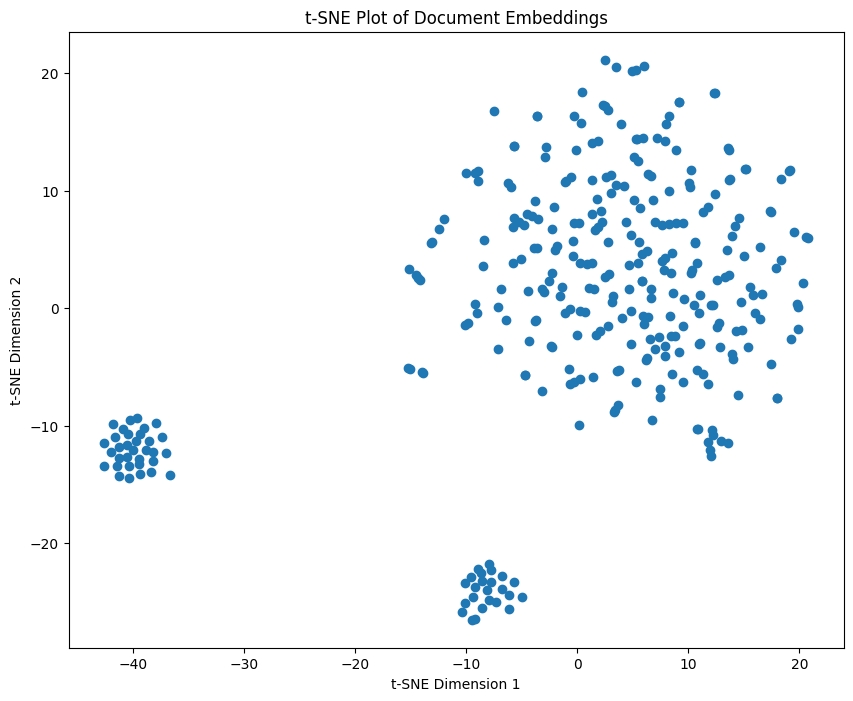

In [ ]:
# Assuming 'tsne_embeddings' contains the 2D t-SNE embeddings
x = tsne_embeddings[:, 0]
y = tsne_embeddings[:, 1]

# Create a scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(x, y)
plt.title("t-SNE Plot of Document Embeddings")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

## Test embeddings

In [ ]:
query_result = embeddings.embed_query("What is the english version meaning of Rex non potest malum vel injuriam facere?")
len(query_result)

1536

In [ ]:
query_result

[-0.006335541205767886,
 -0.01744977961634109,
 -0.005080232449227609,
 -0.028396860058543097,
 -0.016833596105510405,
 -0.004955684817391893,
 -0.018446160671026814,
 -0.00723031776048067,
 -0.0032529875506645775,
 -0.007957938209467422,
 0.01756777073718375,
 -9.76613238070085e-05,
 0.0168729258582429,
 0.0033185389235870252,
 0.021291090395559435,
 0.02448999720791037,
 0.038203347869180004,
 -0.012920177675207202,
 0.01191068639250312,
 0.006443701285411297,
 0.0018452714620882766,
 0.009826152687003152,
 -0.007912051945741868,
 0.01927210783015127,
 -0.011425606093178619,
 0.022353021659014375,
 0.012585866395077722,
 -0.009413179107440925,
 0.03437514638665744,
 -0.01963919421466536,
 0.016938477929657286,
 0.01535213475150018,
 -0.01887879912695529,
 -0.008724889808170546,
 -0.03474223277117153,
 -0.02476531292761852,
 0.010481666881888922,
 0.000373642895507146,
 0.022182589626098276,
 -0.020635575269351083,
 0.04761652697662093,
 0.014093548205124666,
 0.009813042458984792,
 -

## Load the PDF using PyPDFLoader

In [ ]:
loader = PyPDFLoader(PDF)

In [ ]:
pages = loader.load_and_split()

## Display first page

In [ ]:
pages[0]

Document(page_content='The Project Gutenberg eBook of A collection of Latin maxims & rules, in law and equity  \n     \nThis ebook is for the use of anyone anywhere in the United States and  \nmost other parts of the world at no cost and with almost no restrictions  \nwhatsoever. You may copy it, give it away or re -use it under the terms  \nof the Project Gutenberg License included with this ebook or online  \nat www.gutenberg.org. If you are not located in the United States,  \nyou will have to check the laws of the country where you are located  \nbefore using this eBook.  \n \nTitle: A collection of Latin maxims & rules, in law and equity  \n \n \nAuthor: Peter Halkerston  \n \nRelease date: November 27, 2023 [eBook #72240]  \n \nLanguage: English  \n \nOriginal publication: Edinburgh: John Anderson and Co, 1823  \n \nCredits: Linda Cantoni and the Online Distributed Proofreading Team at https://www.pgdp.net \n(This file was produced from images generously made available by The Int

## Display all pages

In [ ]:
pages

[Document(page_content='The Project Gutenberg eBook of A collection of Latin maxims & rules, in law and equity  \n     \nThis ebook is for the use of anyone anywhere in the United States and  \nmost other parts of the world at no cost and with almost no restrictions  \nwhatsoever. You may copy it, give it away or re -use it under the terms  \nof the Project Gutenberg License included with this ebook or online  \nat www.gutenberg.org. If you are not located in the United States,  \nyou will have to check the laws of the country where you are located  \nbefore using this eBook.  \n \nTitle: A collection of Latin maxims & rules, in law and equity  \n \n \nAuthor: Peter Halkerston  \n \nRelease date: November 27, 2023 [eBook #72240]  \n \nLanguage: English  \n \nOriginal publication: Edinburgh: John Anderson and Co, 1823  \n \nCredits: Linda Cantoni and the Online Distributed Proofreading Team at https://www.pgdp.net \n(This file was produced from images generously made available by The In

In [ ]:
vector_store = Pinecone.from_documents(
    pages,
    embeddings,
    index_name = PINECONE_INDEX_NAME
)

## Perform a similarity search to do a pure semantic search

In [ ]:
query = "What is the english version meaning of Rex non potest malum vel injuriam facere?"
docs = vector_store.similarity_search(query)

In [ ]:
docs

[Document(page_content='Rex lege cadere non potest.\nThe king cannot fall in law.\nRex neque solvit damna in lege neque recipit.\nThe king neither pays losses, nor receives them in the law.\nRex nihil aliud est quam lex agens.\nThe king is nothing else than the acting law.\nRex nil dat nisi per recordum.\nThe king gives nothing, unless by record.\nRex nil potest jubere nisi per curiam legitime constitutam.\nThe king can order nothing, unless by parliament lawfully constituted.\nRex non est ubi voluntas dominatur.\nHe is not a king, when his will domineers.\nRex non potest invitum civem regno depellere.\nThe king may not expel from the kingdom, a subject against his will.\nRex non potest malum vel injuriam facere.\nThe king may do no evil or injustice.\nRex non potest subditum onerare impositionibus.\nThe king may not burden a subject with taxes.\nRex nunquam infra ætatem est.\nThe king is never below age.\nRex præsumitur in scrinio pectoris sui habere omnia jura.', metadata={'source': 

In [ ]:
print(docs[0].page_content)

Rex lege cadere non potest.
The king cannot fall in law.
Rex neque solvit damna in lege neque recipit.
The king neither pays losses, nor receives them in the law.
Rex nihil aliud est quam lex agens.
The king is nothing else than the acting law.
Rex nil dat nisi per recordum.
The king gives nothing, unless by record.
Rex nil potest jubere nisi per curiam legitime constitutam.
The king can order nothing, unless by parliament lawfully constituted.
Rex non est ubi voluntas dominatur.
He is not a king, when his will domineers.
Rex non potest invitum civem regno depellere.
The king may not expel from the kingdom, a subject against his will.
Rex non potest malum vel injuriam facere.
The king may do no evil or injustice.
Rex non potest subditum onerare impositionibus.
The king may not burden a subject with taxes.
Rex nunquam infra ætatem est.
The king is never below age.
Rex præsumitur in scrinio pectoris sui habere omnia jura.


In [ ]:
print(docs[0].metadata)

{'source': '/content/gdrive/MyDrive/Chatbot/A collection of Latin maxims & rules, in law and equity.pdf'}


### In addition to using similarity search in the retriever object, you can also use mmr as retriever

In [ ]:
retriever = vector_store.as_retriever(search_type = "mmr")
matched_docs = retriever.get_relevant_documents(query)
for i, d in enumerate(matched_docs):
    print(f"## Document {i}\n")
    print(d.page_content)
    print(f"\n")
    print(d.metadata)
    print(f"\n")

## Document 0

Rex lege cadere non potest.
The king cannot fall in law.
Rex neque solvit damna in lege neque recipit.
The king neither pays losses, nor receives them in the law.
Rex nihil aliud est quam lex agens.
The king is nothing else than the acting law.
Rex nil dat nisi per recordum.
The king gives nothing, unless by record.
Rex nil potest jubere nisi per curiam legitime constitutam.
The king can order nothing, unless by parliament lawfully constituted.
Rex non est ubi voluntas dominatur.
He is not a king, when his will domineers.
Rex non potest invitum civem regno depellere.
The king may not expel from the kingdom, a subject against his will.
Rex non potest malum vel injuriam facere.
The king may do no evil or injustice.
Rex non potest subditum onerare impositionibus.
The king may not burden a subject with taxes.
Rex nunquam infra ætatem est.
The king is never below age.
Rex præsumitur in scrinio pectoris sui habere omnia jura.


{'source': '/content/gdrive/MyDrive/Chatbot/A col

## Or use max_marginal_relevance_search directly

In [ ]:
found_docs = vector_store.max_marginal_relevance_search(query, k = 4, fetch_k = 10)
for i, doc in enumerate(found_docs):
    print(f"[{i + 1}]", doc.page_content, "\n")

[1] Rex lege cadere non potest.
The king cannot fall in law.
Rex neque solvit damna in lege neque recipit.
The king neither pays losses, nor receives them in the law.
Rex nihil aliud est quam lex agens.
The king is nothing else than the acting law.
Rex nil dat nisi per recordum.
The king gives nothing, unless by record.
Rex nil potest jubere nisi per curiam legitime constitutam.
The king can order nothing, unless by parliament lawfully constituted.
Rex non est ubi voluntas dominatur.
He is not a king, when his will domineers.
Rex non potest invitum civem regno depellere.
The king may not expel from the kingdom, a subject against his will.
Rex non potest malum vel injuriam facere.
The king may do no evil or injustice.
Rex non potest subditum onerare impositionibus.
The king may not burden a subject with taxes.
Rex nunquam infra ætatem est.
The king is never below age.
Rex præsumitur in scrinio pectoris sui habere omnia jura. 

[2] Non minor est proditio legis quam regem velle perdere.  

## Generative Question-Answering

In [ ]:
# chat completion llm
llm = ChatOpenAI(
    openai_api_key = OPENAI_API_KEY,
    model_name = 'gpt-3.5-turbo',
    temperature = 0.0
)

# conversational memory
conversational_memory = ConversationBufferWindowMemory(
    memory_key = 'chat_history',
    k = 5,
    return_messages = True
)

# retrieval qa chain
qa = RetrievalQA.from_chain_type(
    llm = llm,
    chain_type = "stuff",
    retriever = vector_store.as_retriever()
)

In [ ]:
qa.run(query)

'The English translation of "Rex non potest malum vel injuriam facere" is "The king may do no evil or injustice."'

## Convert this retrieval chain into a tool

In [ ]:
tools = [
    Tool(
        name = 'A collection of Latin maxims and rules, in law and equity',
        func = qa.run,
        description = (
            'use this tool when answering general knowledge queries to get '
            'more information about the topic'
        )
    )
]

## Initialize the agent

In [ ]:
agent = initialize_agent(
    agent = 'chat-conversational-react-description',
    tools = tools,
    llm = llm,
    verbose = True,
    max_iterations = 3,
    early_stopping_method = 'generate',
    memory = conversational_memory
)

## Using the Conversational Agent

In [ ]:
agent(query)



> Entering new AgentExecutor chain...
{
    "action": "A collection of Latin maxims and rules, in law and equity",
    "action_input": "Rex non potest malum vel injuriam facere"
}
Observation: The king may do no evil or injustice.
Thought:{
    "action": "Final Answer",
    "action_input": "The English version meaning of 'Rex non potest malum vel injuriam facere' is 'The king may do no evil or injustice.'"
}

> Finished chain.


{'input': 'What is the english version meaning of Rex non potest malum vel injuriam facere?',
 'chat_history': [],
 'output': "The English version meaning of 'Rex non potest malum vel injuriam facere' is 'The king may do no evil or injustice.'"}

In [ ]:
index = pinecone.Index(PINECONE_INDEX_NAME)
index.describe_index_stats()

{'dimension': 1536,
 'index_fullness': 0.03031,
 'namespaces': {'': {'vector_count': 3031}},
 'total_vector_count': 3031}

## streamlit app

In [ ]:
%%writefile app.py

import os
import pinecone
import streamlit as st
import tiktoken

from langchain.chains import RetrievalQA
from langchain.chat_models import ChatOpenAI
from langchain.document_loaders import DirectoryLoader
from langchain.embeddings.openai import OpenAIEmbeddings
from langchain.text_splitter import CharacterTextSplitter
from langchain.vectorstores import Pinecone

# OpenAI
OPENAI_API_KEY = "<Add Key>"
MODEL_NAME = "text-embedding-ada-002"

# Pinecone
PINECONE_API_KEY = "<Add Key>"
PINECONE_ENV = "gcp-starter"
PINECONE_INDEX_NAME = "capstone"

os.environ['OPENAI_API_KEY'] = OPENAI_API_KEY
os.environ['PINECONE_API_KEY'] = PINECONE_API_KEY
os.environ['PINECONE_ENV'] = PINECONE_ENV
os.environ['PINECONE_INDEX_NAME'] = PINECONE_INDEX_NAME

css = '''
<style>
.chat-message {
    padding: 1.5rem; border-radius: 0.5rem; margin-bottom: 1rem; display: flex
}
.chat-message.user {
    background-color: #2b313e
}
.chat-message.bot {
    background-color: #475063
}
.chat-message .avatar {
    width: 20%;
}
.chat-message .avatar img {
    max-width: 78px;
    max-height: 78px;
    border-radius: 50%;
    object-fit: cover;
}
.chat-message .message {
    width: 80%;
    padding: 0 1.5rem;
    color: #fff;
}
'''

bot_template = '''
<div class="chat-message bot">
    <div class="avatar">
        <img src="https://cdn.pixabay.com/photo/2023/01/10/20/04/ai-generated-7710456_1280.jpg" style="max-height: 78px; max-width: 78px; border-radius: 50%; object-fit: cover;">
    </div>
    <div class="message">{{MSG}}</div>
</div>
'''

user_template = '''
<div class="chat-message user">
    <div class="avatar">
        <img src="https://cdn.pixabay.com/photo/2015/03/04/19/43/woman-659354_1280.jpg" style="max-height: 78px; max-width: 78px; border-radius: 50%; object-fit: cover;">
    </div>
    <div class="message">{{MSG}}</div>
</div>
'''

def document_preprocessing():
    loader = DirectoryLoader(
        path = "/content/gdrive/MyDrive/Chatbot/",   # path to directory
        glob = "*.pdf",       # pattern to use to find files
        show_progress = True # flag whether to show a progress bar
    )
    documents = loader.load()
    text_splitter = CharacterTextSplitter(
        separator = "\n",     # default is "\n\n"
        chunk_size = 1000,    # max number of characters in each chunk
        chunk_overlap = 200,  # overlap between chunks to make sure that the semantic context does not get lost between chunks
        length_function = len
    )
    split_documents = text_splitter.split_documents(documents)
    return split_documents

@st.cache_resource
def get_vector_store():
    # OpenAI Embeddings setup
    embeddings = OpenAIEmbeddings(
      model = MODEL_NAME,
      openai_api_key = OPENAI_API_KEY
    )

    # Initialize the Pinecone vector database
    pinecone.init(
        api_key = PINECONE_API_KEY,
        environment = PINECONE_ENV
    )

    split_documents = document_preprocessing()

    vector_store = Pinecone.from_documents(
        split_documents,
        embeddings,
        index_name = PINECONE_INDEX_NAME
    )
    return vector_store

def generate_response(query):
    # Chat completion llm
    llm = ChatOpenAI(
        openai_api_key = OPENAI_API_KEY,
        model_name = "gpt-3.5-turbo",    # Most capable GPT-3.5 model and optimized for chat. Max tokens is 4,096 and training data up to Sep 2021.
        temperature = 0.0                # a number between 0 and 1 that governs the randomness and thus the creativity of the responses.
                                         # A temperature of 0 means the responses will be very straightforward, almost deterministic.
                                         # A temperature of 1 means the responses can vary wildly.
    )

    # Get vector store
    vector_store = get_vector_store()

    qa = RetrievalQA.from_chain_type(
        llm = llm,
        chain_type = "stuff",                    # The default chain_type = "stuff" uses ALL the text from the documents in the prompt.
        retriever = vector_store.as_retriever(), # A retriever is an interface that returns documents given an unstructured query.
    )

    # A single-input chain that takes a 'query' string
    result = qa.run(query) # Convenience method for executing chain.
    return result

def main():
    st.title("A collection of Latin maxims and rules, in law and equity GPT")

    st.write(css, unsafe_allow_html = True)

    st.sidebar.title("About")
    st.sidebar.markdown(
    """
    A collection of Latin maxims and rules, in law and equity GPT allows you to ask questions from data contained in pdf documents that have been placed in the /content folder.
    """
    )
    st.sidebar.markdown(
    """
    Enter your question and press Submit to get an answer.
    """
    )
    st.sidebar.image("https://cdn.pixabay.com/photo/2020/04/21/16/49/letter-5073857_150.jpg", width = 240)

    text_input = st.text_input("Enter Query and press Submit")

    if st.button("Submit"):
        if len(text_input) > 0:
            #st.info("Your Query: " + text_input)
            st.write(user_template.replace("{{MSG}}", text_input), unsafe_allow_html=True)
            answer = generate_response(text_input)
            #st.success(answer)
            st.write(bot_template.replace("{{MSG}}", answer), unsafe_allow_html=True)

if __name__ == "__main__":
    main()

Writing app.py


In [ ]:
!streamlit run app.py &>/content/logs.txt & npx localtunnel --port 8501 & curl ipv4.icanhazip.com

34.28.39.221
npx: installed 22 in 5.572s
your url is: https://common-terms-prove.loca.lt


### Conclusions

LexMax AI, the interactive chatbot for Legal Latin Maxims and Equity Rules, successfully combines advanced technology with legal education. This tool effectively simplifies and explains complex legal terms, making them more accessible to students, professionals, and legal enthusiasts. By integrating AI technologies like Langchain, ChatGPT, Pinecone, and Streamlit, LexMax AI offers a user-friendly platform that enhances the understanding of legal concepts. This project demonstrates the potential of AI to transform and simplify learning in specialized fields like law.